# Deep Learning HW1 --- Data Loading/Preprocessing

## GPU Information

In [ ]:
!nvidia-smi

Sat Nov  9 02:54:05 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Load Required Libraries

In [ ]:
import torch
import os
from timm import create_model
from timm.data import create_dataset, create_loader, create_transform
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import timm
from timm.data.transforms import RandomResizedCropAndInterpolation
from timm.data.auto_augment import rand_augment_transform
from torch.utils.data import random_split

In [ ]:
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

## Download Dataset

In [ ]:
#!wget http://groups.csail.mit.edu/vision/LabelMe/NewImages/indoorCVPR_09.tar

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/Datasets/indoorCVPR_09.tar /content

In [ ]:
!tar -xf indoorCVPR_09.tar

## Data Preprocessing

### Splitting Data into Train and Test Directories

In [ ]:
import os
import shutil
import random

# Set random seed for reproducibility
random.seed(42)
split_ratio = 0.8

# Define source and destination directories
source_dir = '/content/Images'
train_dir = '/content/data/train'
test_dir = '/content/data/test'

# Create train and test directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Iterate through each subdirectory (class) in the source directory
for class_name in os.listdir(source_dir):
    class_dir = os.path.join(source_dir, class_name)

    # Skip if it's not a directory
    if not os.path.isdir(class_dir):
        continue

    # Create corresponding directories in train and test
    train_class_dir = os.path.join(train_dir, class_name)
    test_class_dir = os.path.join(test_dir, class_name)
    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)

    # Get all image files in the class directory
    images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # Shuffle the images
    random.shuffle(images)

    # Calculate the split index
    split_index = int(split_ratio * len(images))

    # Split and move images
    for i, image in enumerate(images):
        src_path = os.path.join(class_dir, image)
        if i < split_index:
            dst_path = os.path.join(train_class_dir, image)
        else:
            dst_path = os.path.join(test_class_dir, image)
        shutil.copy2(src_path, dst_path)  # Use copy2 to preserve metadata

    print(f"Processed {class_name}: {split_index} images to train, {len(images) - split_index} images to test")

print("Dataset splitting completed!")

Processed tv_studio: 132 images to train, 34 images to test
Processed airport_inside: 486 images to train, 122 images to test
Processed florist: 82 images to train, 21 images to test
Processed mall: 140 images to train, 36 images to test
Processed fastfood_restaurant: 92 images to train, 24 images to test
Processed corridor: 276 images to train, 70 images to test
Processed inside_bus: 81 images to train, 21 images to test
Processed bookstore: 304 images to train, 76 images to test
Processed clothingstore: 84 images to train, 22 images to test
Processed library: 85 images to train, 22 images to test
Processed waitingroom: 120 images to train, 31 images to test
Processed office: 87 images to train, 22 images to test
Processed kitchen: 587 images to train, 147 images to test
Processed elevator: 80 images to train, 21 images to test
Processed studiomusic: 86 images to train, 22 images to test
Processed laboratorywet: 100 images to train, 25 images to test
Processed computerroom: 91 images 

### Create Dataset without transform (i.e. original images)

In [ ]:
data_dir = '/content/data'
train_dataset = create_dataset('indoorcvpr_train', root=data_dir, split='train', is_training=True)
test_dataset = create_dataset('indoorcvpr_test', root=data_dir, split='test', is_training=False)

In [ ]:
len(train_dataset), len(test_dataset)

(12467, 3153)

#### Class Mapping

In [ ]:
train_dir = os.path.join(data_dir, "train")
classes = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]
classes.sort()
class_to_idx = {classes[i]: i for i in range(len(classes))}
idx_to_class = {i: classes[i] for i in range(len(classes))}

In [ ]:
classes

['airport_inside',
 'artstudio',
 'auditorium',
 'bakery',
 'bar',
 'bathroom',
 'bedroom',
 'bookstore',
 'bowling',
 'buffet',
 'casino',
 'children_room',
 'church_inside',
 'classroom',
 'cloister',
 'closet',
 'clothingstore',
 'computerroom',
 'concert_hall',
 'corridor',
 'deli',
 'dentaloffice',
 'dining_room',
 'elevator',
 'fastfood_restaurant',
 'florist',
 'gameroom',
 'garage',
 'greenhouse',
 'grocerystore',
 'gym',
 'hairsalon',
 'hospitalroom',
 'inside_bus',
 'inside_subway',
 'jewelleryshop',
 'kindergarden',
 'kitchen',
 'laboratorywet',
 'laundromat',
 'library',
 'livingroom',
 'lobby',
 'locker_room',
 'mall',
 'meeting_room',
 'movietheater',
 'museum',
 'nursery',
 'office',
 'operating_room',
 'pantry',
 'poolinside',
 'prisoncell',
 'restaurant',
 'restaurant_kitchen',
 'shoeshop',
 'stairscase',
 'studiomusic',
 'subway',
 'toystore',
 'trainstation',
 'tv_studio',
 'videostore',
 'waitingroom',
 'warehouse',
 'winecellar']

#### Plotting Images

In [ ]:
def plot_images(images, labels, title, filename):
    fig, axes = plt.subplots(2, 3, figsize=(10, 6))
    fig.suptitle(title)
    for i, ax in enumerate(axes.flat):
        if isinstance(images[i], torch.Tensor):
            img = images[i].permute(1, 2, 0).numpy()  # Convert from CxHxW to HxWxC
        else:
            img = images[i]
        ax.imshow(img)
        ax.set_title(f"Id Label: {labels[i]} | {idx_to_class[labels[i]]}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    plt.savefig(filename+".svg")
    plt.savefig(filename+".pdf")

In [ ]:
indices = np.random.choice(len(train_dataset), 6, replace=False)
original_images = []
id_labels = []
named_labels = []
for idx in indices:
    img, label = train_dataset[idx]
    original_images.append(img)
    id_labels.append(label)
    named_labels.append(idx_to_class[label])

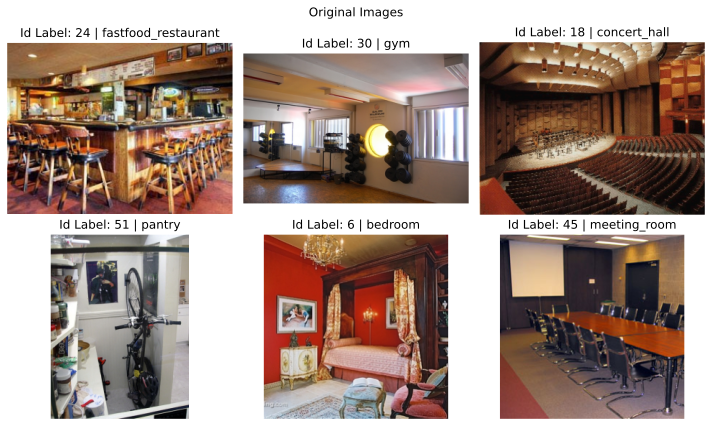

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_images(original_images, id_labels, "Original Images", "original-images")

### Data Augmentation

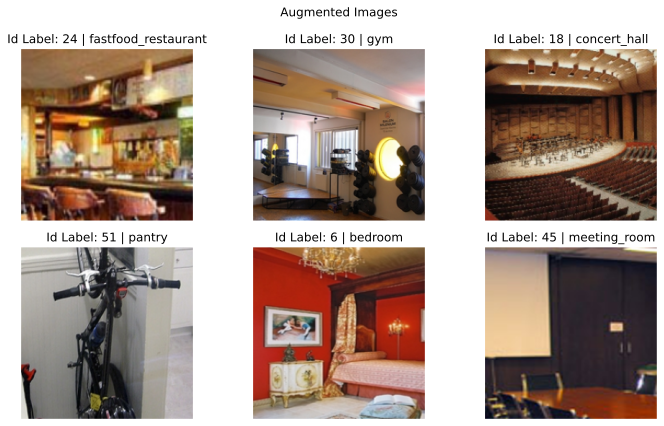

<Figure size 640x480 with 0 Axes>

In [ ]:
tfm = RandomResizedCropAndInterpolation(size=224, interpolation='random')
augmented_images = [tfm(img) for img in original_images]
plot_images(augmented_images, id_labels, "Augmented Images", "augmented-images-rrci")

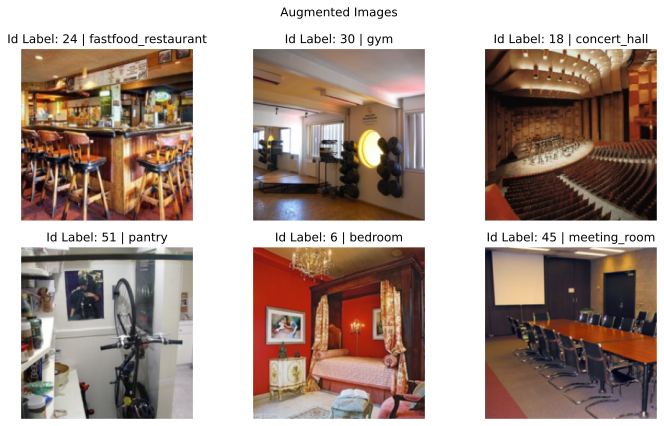

<Figure size 640x480 with 0 Axes>

In [ ]:
tfm = RandomResizedCropAndInterpolation(size=224, scale=(0.8, 1))
augmented_images = [tfm(img) for img in original_images]
plot_images(augmented_images, id_labels, "Augmented Images", "augmented-rrci-scaled")

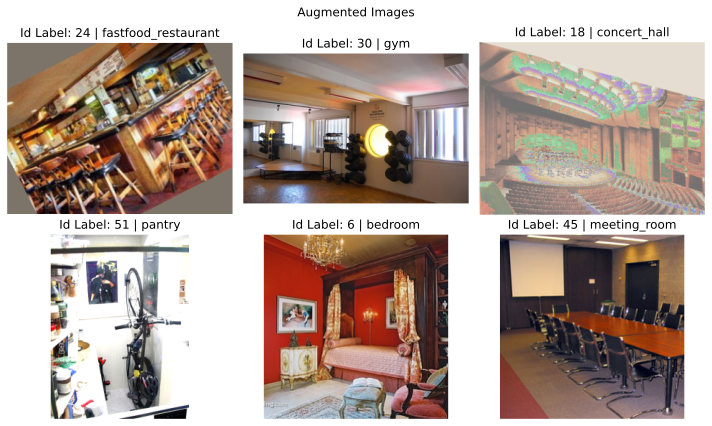

<Figure size 640x480 with 0 Axes>

In [ ]:
tfm = rand_augment_transform(
    config_str='rand-m9-mstd0.5',
    hparams={'img_mean': (124, 116, 104)}
)
augmented_images = [tfm(img) for img in original_images]
plot_images(augmented_images, id_labels, "Augmented Images", "augmented-images")

### Mixup and CutMix

In [ ]:
# def get_dataset_and_loader(mixup_args, dataset):
#     mixup_fn = Mixup(**mixup_args)
#     loader = create_loader(dataset,
#                            input_size=(3,224,224),
#                            batch_size=4,
#                            is_training=True,
#                            use_prefetcher=False)
#     return mixup_fn, loader

In [ ]:
# def imshow(inp, title=None):
#     """Imshow for Tensor."""
#     inp = inp.numpy().transpose((1, 2, 0))
#     mean = np.array([0.485, 0.456, 0.406])
#     std = np.array([0.229, 0.224, 0.225])
#     inp = std * inp + mean
#     inp = np.clip(inp, 0, 1)
#     plt.imshow(inp)
#     if title is not None:
#         plt.title(title)
#     plt.pause(0.001)

In [ ]:
# from timm.data.mixup import Mixup

# mixup_args = {
#     'mixup_alpha': 1.0,
#     'cutmix_alpha': 0.4,
#     'cutmix_minmax': None,
#     'prob': 0.5,
#     'switch_prob': 0.5,
#     'mode': 'batch',
#     'label_smoothing': 0.1,
#     'num_classes': 67}

In [ ]:
# mixup_fn, loader = get_dataset_and_loader(mixup_args, train_dataset)

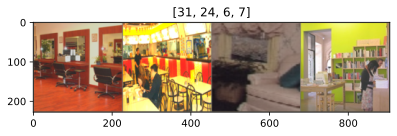

In [ ]:
# import torchvision
# inputs, classes = next(iter(loader))
# out = torchvision.utils.make_grid(inputs)
# imshow(out, title=[x.item() for x in classes])

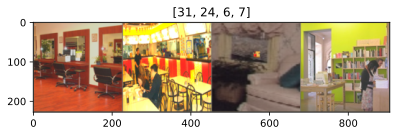

In [ ]:
# inputs, classes = mixup_fn(inputs, classes)
# out = torchvision.utils.make_grid(inputs)
# imshow(out, title=[x.item() for x in classes.argmax(1)])

### Create DataSet with Augmentation

In [ ]:
train_transform = create_transform(
    input_size=224,
    is_training=True,
    auto_augment='rand-m9-mstd0.5'
)

test_transform = create_transform(
    input_size=224,
    is_training=False
)

In [ ]:
data_dir = '/content/data'
train_dataset = create_dataset('indoorcvpr_train', root=data_dir, split='train', is_training=True, transform=train_transform)
test_dataset = create_dataset('indoorcvpr_test', root=data_dir, split='test', is_training=False, transform=test_transform)

In [ ]:
len(train_dataset), len(test_dataset)

(12467, 3153)

### Create Loaders

In [ ]:
# Create loaders
try:
    # only works if gpu present on machine
    train_loader = create_loader(train_dataset,
                                 input_size=224,
                                 batch_size=32,
                                 is_training=True)
    test_loader = create_loader(test_dataset,
                                input_size=224,
                                batch_size=32,
                                is_training=False)
except:
    train_loader = create_loader(train_dataset,
                                 input_size=224,
                                 batch_size=32,
                                 is_training=True,
                                 use_prefetcher=False)
    test_loader = create_loader(test_dataset,
                                input_size=224,
                                batch_size=32,
                                is_training=False,
                                use_prefetcher=False)

In [ ]:
num_classes = len(classes)
num_classes

67

# Models

## Model 1: Resnet50d


*   Optimizer: Adam, lr=0.001
*   Pooling: max
*   num_classes=67







In [ ]:
model = timm.create_model('resnet50d', pretrained=True, exportable=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
model.default_cfg

{'url': 'https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/resnet50d_ra2-464e36ba.pth',
 'hf_hub_id': 'timm/resnet50d.ra2_in1k',
 'architecture': 'resnet50d',
 'tag': 'ra2_in1k',
 'custom_load': False,
 'input_size': (3, 224, 224),
 'test_input_size': (3, 288, 288),
 'fixed_input_size': False,
 'interpolation': 'bicubic',
 'crop_pct': 0.875,
 'test_crop_pct': 0.95,
 'crop_mode': 'center',
 'mean': (0.485, 0.456, 0.406),
 'std': (0.229, 0.224, 0.225),
 'num_classes': 1000,
 'pool_size': (7, 7),
 'first_conv': 'conv1.0',
 'classifier': 'fc',
 'origin_url': 'https://github.com/huggingface/pytorch-image-models'}

In [ ]:
model.get_classifier()

Linear(in_features=2048, out_features=1000, bias=True)

### Modified Pooling and num_classes of final fully connected layer

In [ ]:
model.reset_classifier(num_classes, 'max')

print(f'Modified pooling: {model.global_pool}')
print(f'Modified classifier: {model.get_classifier()}')

Modified pooling: SelectAdaptivePool2d(pool_type=max, flatten=Flatten(start_dim=1, end_dim=-1))
Modified classifier: Linear(in_features=2048, out_features=67, bias=True)


In [ ]:
model.eval()
model(torch.randn(1, 3, 224, 224)).shape

torch.Size([1, 67])

### Install tochinfo for model Summary

In [ ]:
!pip install torchinfo

In [ ]:
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.") #pip install -q torchinfo

In [ ]:
summary(model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 67]             --                   True
├─Sequential (conv1)                     [32, 3, 224, 224]    [32, 64, 112, 112]   --                   True
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    └─BatchNorm2d (1)                   [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    └─ReLU (2)                          [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Conv2d (3)                        [32, 32, 112, 112]   [32, 32, 112, 112]   9,216                True
│    └─BatchNorm2d (4)                   [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    └─ReLU (5)                          [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Conv2d (6) 

### Model Training

#### Check GPU

In [ ]:
train_on_gpu = torch.cuda.is_available()
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


#### Loss Function and Optimizer

In [ ]:
from torch import nn
# Define loss and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

#### Training

In [ ]:
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    Args:
    model: A PyTorch model to be trained.
    dataloader: A DataLoader instance for the model to be trained on.
    loss_fn: A PyTorch loss function to minimize.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of training loss and training accuracy metrics.
    In the form (train_loss, train_accuracy). For example:

    (0.1112, 0.8743)
    """
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    Args:
    model: A PyTorch model to be tested.
    dataloader: A DataLoader instance for the model to be tested on.
    loss_fn: A PyTorch loss function to calculate loss on the test data.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of testing loss and testing accuracy metrics.
    In the form (test_loss, test_accuracy). For example:

    (0.0223, 0.8985)
    """
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

    # Return the filled results at the end of the epochs
    return results

In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results = train(model=model,
                       train_dataloader=train_loader,
                       test_dataloader=test_loader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=10,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4048 | train_acc: 0.4057 | test_loss: 1.5527 | test_acc: 0.5805
Epoch: 2 | train_loss: 1.7007 | train_acc: 0.5419 | test_loss: 1.5062 | test_acc: 0.6044
Epoch: 3 | train_loss: 1.5481 | train_acc: 0.5811 | test_loss: 1.3569 | test_acc: 0.6303
Epoch: 4 | train_loss: 1.4412 | train_acc: 0.5998 | test_loss: 1.3141 | test_acc: 0.6400
Epoch: 5 | train_loss: 1.3626 | train_acc: 0.6259 | test_loss: 1.2503 | test_acc: 0.6583
Epoch: 6 | train_loss: 1.2874 | train_acc: 0.6393 | test_loss: 1.2355 | test_acc: 0.6708
Epoch: 7 | train_loss: 1.2526 | train_acc: 0.6466 | test_loss: 1.2383 | test_acc: 0.6658
Epoch: 8 | train_loss: 1.2232 | train_acc: 0.6568 | test_loss: 1.2715 | test_acc: 0.6642
Epoch: 9 | train_loss: 1.1710 | train_acc: 0.6758 | test_loss: 1.2566 | test_acc: 0.6822
Epoch: 10 | train_loss: 1.1326 | train_acc: 0.6808 | test_loss: 1.3452 | test_acc: 0.6595
[INFO] Total training time: 1913.031 seconds


#### Plot Model Loss and Accuracy Curves

In [ ]:
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

In [ ]:
import matplotlib.pyplot as plt

def plot_metrics(results):
    """
    Plot loss and accuracy curves from results.

    Parameters:
    results (dict): Dictionary containing training and testing metrics
    """
    # Create a 1x2 grid for plotting
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot Losses
    axs[0].plot(results['train_loss'], label='Train Loss', color='blue')
    axs[0].plot(results['test_loss'], label='Test Loss', color='orange')
    axs[0].set_title('Training and Testing Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    axs[0].legend()
    axs[0].grid(True)

    # Plot Accuracies
    axs[1].plot(results['train_acc'], label='Train Accuracy', color='blue')
    axs[1].plot(results['test_acc'], label='Test Accuracy', color='orange')
    axs[1].set_title('Training and Testing Accuracy')
    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Accuracy')
    axs[1].legend()
    axs[1].grid(True)

    # Adjust layout for better spacing
    plt.tight_layout()

    # Show the plots
    plt.plot()
    plt.savefig('/content/resenet50d-model1.svg')
    plt.savefig('/content/resenet50d-model1.pdf')

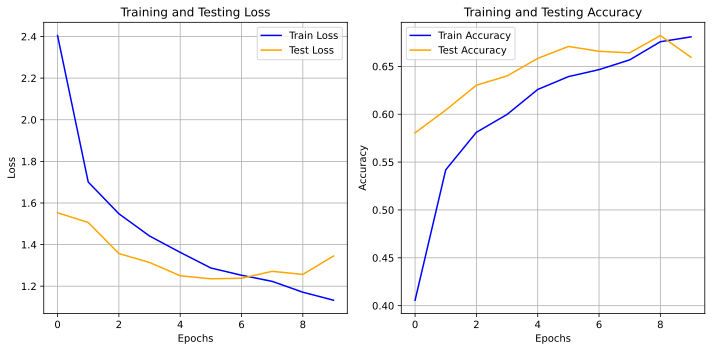

In [ ]:
plot_metrics(results)
plt.savefig('/content/resenet50d-model1.svg')
plt.savefig('/content/resenet50d-model1.pdf')

## Model Evaluation Analaysis

In [ ]:
import torch
#from torch.utils.data import DataLoader

# Assuming you have already defined your model architecture
# and loaded the trained weights

# Load the trained model

# Check if CUDA is available and move the model to GPU if possible
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# # Create a DataLoader for your test dataset
# test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Set the model to evaluation mode
model.eval()

# Lists to store predictions and true labels
predictions = []
true_labels = []

# Disable gradient calculation for inference
with torch.no_grad():
    for batch, (inputs, labels) in enumerate(test_loader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(inputs)

        # Get the predicted class (assuming classification task)
        _, predicted = torch.max(outputs, 1)

        # Store predictions and true labels
        predictions.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

# Convert lists to numpy arrays for further analysis
predictions = np.array(predictions)
true_labels = np.array(true_labels)

# Print some basic statistics
print(f"Total samples: {len(predictions)}")
print(f"Accuracy: {np.mean(predictions == true_labels):.4f}")

Total samples: 3153
Accuracy: 0.6587


In [ ]:
label_pred = [classes[i] for i in predictions]
label_true = [classes[i] for i in true_labels]

In [ ]:
from sklearn.metrics import classification_report

# Assume true_labels and pred_labels are defined
print(classification_report(label_true, label_pred))

                     precision    recall  f1-score   support

     airport_inside       0.47      0.80      0.59       122
          artstudio       0.71      0.43      0.53        28
         auditorium       0.64      0.58      0.61        36
             bakery       0.52      0.78      0.62        81
                bar       0.72      0.68      0.70       121
           bathroom       0.59      0.60      0.59        40
            bedroom       0.64      0.80      0.72       133
          bookstore       0.77      0.57      0.65        76
            bowling       0.88      0.88      0.88        43
             buffet       0.65      0.65      0.65        23
             casino       0.72      0.93      0.81       103
      children_room       0.37      0.30      0.33        23
      church_inside       0.67      0.89      0.76        36
          classroom       0.66      0.83      0.73        23
           cloister       0.57      0.96      0.72        24
             closet    

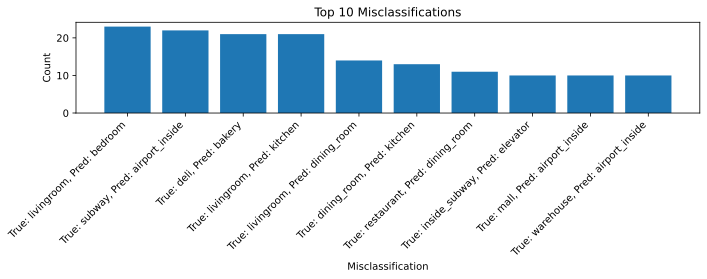

In [ ]:
from collections import Counter

# Get misclassifications
misclassifications = [(true, pred) for true, pred in zip(label_true, label_pred) if true != pred]
misclass_counts = Counter(misclassifications)

# Plot top 10 misclassifications
top_10 = misclass_counts.most_common(10)
labels, counts = zip(*top_10)
true_labels, pred_labels = zip(*labels)

plt.figure(figsize=(10, 4))
plt.bar(range(10), counts)
plt.xlabel('Misclassification')
plt.ylabel('Count')
plt.title('Top 10 Misclassifications')
plt.xticks(range(10), [f'True: {t}, Pred: {p}' for t, p in zip(true_labels, pred_labels)], rotation=45, ha='right')
plt.tight_layout()
plt.plot()
plt.savefig('/content/misclassifications.pdf')

## Model2: ResNet50d


*   Optimizer = sgd, lr=0.001, momentum=0.8, weight_decay=0.01
*   Pooling - max
*   CosineLearningRateScheduler
*   Mixup function



In [ ]:
model2 = timm.create_model('resnet50d', pretrained=True, exportable=True)

### Pooling and Number of output Classes

In [ ]:
model2.reset_classifier(num_classes, 'max')

print(f'Modified pooling: {model2.global_pool}')
print(f'Modified classifier: {model2.get_classifier()}')

Modified pooling: SelectAdaptivePool2d(pool_type=max, flatten=Flatten(start_dim=1, end_dim=-1))
Modified classifier: Linear(in_features=2048, out_features=67, bias=True)


### Optimizer

In [ ]:
from torch import nn
from timm.optim import create_optimizer_v2

# Define loss and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = create_optimizer_v2(model2.parameters(), opt='sgd', lr=0.001, momentum=0.8, weight_decay=0.01); optimizer, type(optimizer)



(SGD (
 Parameter Group 0
     dampening: 0
     differentiable: False
     foreach: None
     fused: None
     lr: 0.001
     maximize: False
     momentum: 0.8
     nesterov: True
     weight_decay: 0.01
 ),
 torch.optim.sgd.SGD)

### LRScheduler

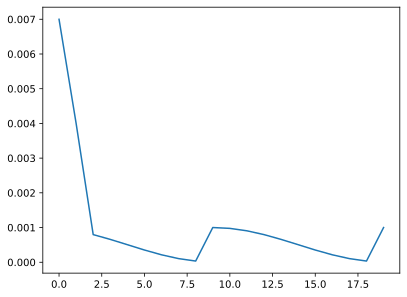

In [ ]:
import timm.scheduler
num_epochs=20
num_epoch_repeat = num_epochs//2
num_steps_per_epoch = len(train_loader)
scheduler = timm.scheduler.CosineLRScheduler(optimizer,
                                            t_initial=num_epoch_repeat,
                                            lr_min=1e-5,
                                            warmup_lr_init=0.01,
                                            warmup_t=3,
                                            cycle_limit=num_epoch_repeat+1
                                           )

def plot_lrs_for_timm_scheduler(scheduler):
    lrs = []

    for epoch in range(num_epochs):
        num_updates = epoch * num_steps_per_epoch

        for i in range(num_steps_per_epoch):
            num_updates += 1
            scheduler.step_update(num_updates=num_updates)

        scheduler.step(epoch + 1)

        lrs.append(optimizer.param_groups[0]["lr"])

    plt.plot(lrs)

plot_lrs_for_timm_scheduler(scheduler)
plt.savefig('/content/resenet50d-model2-lrsched.svg')
plt.savefig('/content/resenet50d-model2-lrsched.pdf')

### Mixup & CutMix Augmentations

In [ ]:
from timm.data.mixup import Mixup

mixup_args = {
    'mixup_alpha': 0.4,
    'cutmix_alpha': 0.2,
    'cutmix_minmax': None,
    'prob': 0.5,
    'switch_prob': 0.5,
    'mode': 'batch',
    'label_smoothing': 0.1,
    'num_classes': num_classes}

mixup_fn = Mixup(**mixup_args)
mixup_fn

### Model Training

In [ ]:
def soft_accuracy(y_pred, y_true):
    _, predicted = torch.max(y_pred.data, 1)
    _, labels = torch.max(y_true.data, 1)
    correct = (predicted == labels).sum().item()
    total = y_pred.size(0)
    return correct / total

from tqdm.auto import tqdm
from typing import Dict, List, Tuple
from timm.optim import Lookahead

def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device,
               epoch:int,
               scheduler) -> Tuple[float, float]:
    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    Args:
    model: A PyTorch model to be trained.
    dataloader: A DataLoader instance for the model to be trained on.
    loss_fn: A PyTorch loss function to minimize.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of training loss and training accuracy metrics.
    In the form (train_loss, train_accuracy). For example:

    (0.1112, 0.8743)
    """
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0
    num_steps_per_epoch = len(dataloader)
    num_updates = epoch * num_steps_per_epoch

    lrs = []

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)
        #Code Change:: Applying Cut Mix and MixUP
        X, y = mixup_fn(X, y)
        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()
        train_acc += soft_accuracy(y_pred, y)
        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()


        #new added for timm
        if scheduler is not None:
          num_updates += 1
          scheduler.step_update(num_updates=num_updates)
          lrs.append(optimizer.param_groups[0]["lr"])
        # Calculate and accumulate accuracy metric across all batches
        #y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        #train_acc += (y_pred_class == y).sum().item()/len(y_pred)
        #Code change: Incorporating Mixup
        #train_acc += (y_pred_class == y.argmax(dim=1)).sum().item()/len(y_pred)

    #Code change: Adding Lookahead
    if isinstance(optimizer, Lookahead):
      optimizer.sync_lookahead()

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc, lrs

def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    Args:
    model: A PyTorch model to be tested.
    dataloader: A DataLoader instance for the model to be tested on.
    loss_fn: A PyTorch loss function to calculate loss on the test data.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of testing loss and testing accuracy metrics.
    In the form (test_loss, test_accuracy). For example:

    (0.0223, 0.8985)
    """
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          scheduler) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": [],
               "all_lrs":[]
    }

    # Make sure model on target device
    model.to(device)
    all_lrs=[]

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc, lrs = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device,
                                          epoch=epoch,
                                                scheduler=scheduler)

        if scheduler is not None:
          all_lrs.extend(lrs)
          scheduler.step(epoch + 1)

        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)
        results["all_lrs"].append(all_lrs)

    # Return the filled results at the end of the epochs
    return results

#### Check GPU

In [ ]:
train_on_gpu = torch.cuda.is_available()
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results2 = train(model=model2,
                       train_dataloader=train_loader,
                       test_dataloader=test_loader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=20,
                       device=device,
                 scheduler=scheduler)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.4421 | train_acc: 0.3038 | test_loss: 1.5212 | test_acc: 0.5978
Epoch: 2 | train_loss: 2.7810 | train_acc: 0.4898 | test_loss: 1.1291 | test_acc: 0.6934
Epoch: 3 | train_loss: 2.1542 | train_acc: 0.6202 | test_loss: 1.0101 | test_acc: 0.7416
Epoch: 4 | train_loss: 2.0136 | train_acc: 0.6685 | test_loss: 0.9126 | test_acc: 0.7735
Epoch: 5 | train_loss: 1.9187 | train_acc: 0.6930 | test_loss: 0.9074 | test_acc: 0.7782
Epoch: 6 | train_loss: 1.9602 | train_acc: 0.6882 | test_loss: 0.8890 | test_acc: 0.7810
Epoch: 7 | train_loss: 1.9080 | train_acc: 0.7096 | test_loss: 0.9064 | test_acc: 0.7814
Epoch: 8 | train_loss: 1.8708 | train_acc: 0.7072 | test_loss: 0.8783 | test_acc: 0.7921
Epoch: 9 | train_loss: 1.8930 | train_acc: 0.7019 | test_loss: 0.8802 | test_acc: 0.7886
Epoch: 10 | train_loss: 1.9283 | train_acc: 0.6989 | test_loss: 0.8915 | test_acc: 0.7829
Epoch: 11 | train_loss: 1.8517 | train_acc: 0.7143 | test_loss: 0.8631 | test_acc: 0.7930
Epoch: 12 | train_l

### Plot Loss and Accuracy Curves

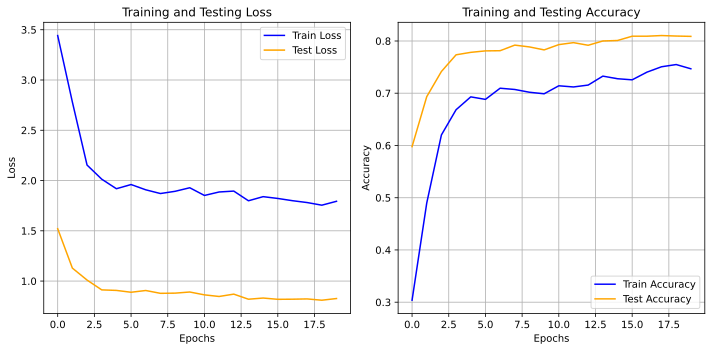

In [ ]:
plot_metrics(results2)
plt.savefig('/content/resenet50d-model2.svg')
plt.savefig('/content/resenet50d-model2.pdf')

In [ ]:
len(results2["all_lrs"])

20

### Plot Learning Rate Schedulers

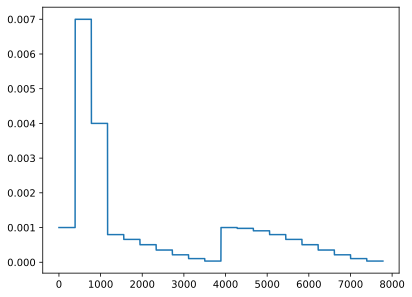

In [ ]:
plt.plot(results2["all_lrs"][0])
plt.savefig('/content/resenet50d-model2-lr0.svg')
plt.savefig('/content/resenet50d-model2-lr0.pdf')

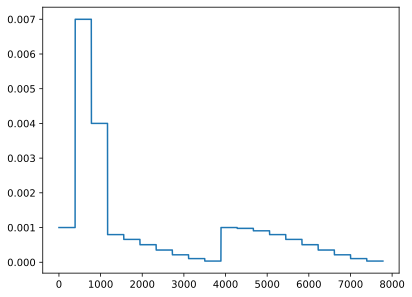

In [ ]:
plt.plot(results2["all_lrs"][5])
plt.savefig('/content/resenet50d-model2-lr5.svg')
plt.savefig('/content/resenet50d-model2-lr5.pdf')

In [ ]:
torch.save(model2, 'model2withlrcutmix.pth')

## Predict and Plot on Test Images

In [ ]:
from typing import List, Tuple
import torchvision
from torchvision import transforms
from PIL import Image

# 1. Take in a trained model, class names, image path, image size, a transform and target device
def pred_and_plot_image(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: torchvision.transforms = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # 10. Plot image with predicted label and probability
    plt.figure()
    plt.imshow(img)

    plt.title(f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}")
    plt.axis(False);

In [ ]:
import random
from pathlib import Path
num_images_to_plot = 3
test_dir = "data/test"
test_image_path_list = list(Path(test_dir).glob("*/*.jpg")) # get list all image paths from test data

In [ ]:
test_image_path_sample = random.sample(population=test_image_path_list, k=num_images_to_plot)

In [ ]:
test_image_path_sample

[PosixPath('data/test/warehouse/warehouse_0303.jpg'),
 PosixPath('data/test/gameroom/int30.jpg'),
 PosixPath('data/test/casino/casino_0228.jpg')]

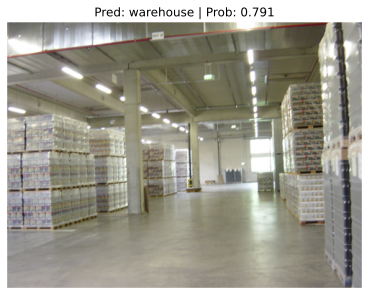

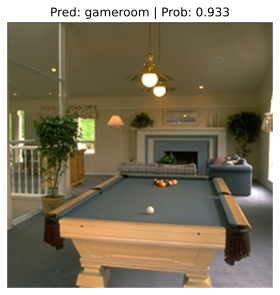

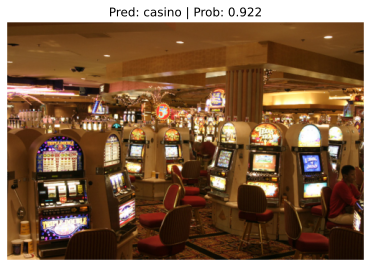

In [ ]:
for image_path in test_image_path_sample:
    pred_and_plot_image(model=model2,
                        image_path=image_path,
                        class_names=classes,
                        # transform=weights.transforms(), # optionally pass in a specified transform from our pretrained model weights
                        image_size=(224, 224))

## Model Evaluation Analaysis

In [ ]:
#model = torch.load('model2withlrcutmix.pth')

<ipython-input-34-b00d065ec8e1>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('model2withlrcutmix.pth')


In [ ]:
import torch
#from torch.utils.data import DataLoader

# Assuming you have already defined your model architecture
# and loaded the trained weights

# Load the trained model

# Check if CUDA is available and move the model to GPU if possible
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model2.to(device)

# # Create a DataLoader for your test dataset
# test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Set the model to evaluation mode
model.eval()

# Lists to store predictions and true labels
predictions = []
true_labels = []

# Disable gradient calculation for inference
with torch.no_grad():
    for batch, (inputs, labels) in enumerate(test_loader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(inputs)

        # Get the predicted class (assuming classification task)
        _, predicted = torch.max(outputs, 1)

        # Store predictions and true labels
        predictions.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

# Convert lists to numpy arrays for further analysis
predictions = np.array(predictions)
true_labels = np.array(true_labels)

# Print some basic statistics
print(f"Total samples: {len(predictions)}")
print(f"Accuracy: {np.mean(predictions == true_labels):.4f}")

Total samples: 3153
Accuracy: 0.8868


In [ ]:
label_pred = [classes[i] for i in predictions]
label_true = [classes[i] for i in true_labels]

In [ ]:
from sklearn.metrics import classification_report

# Assume true_labels and pred_labels are defined
print(classification_report(label_true, label_pred))

                     precision    recall  f1-score   support

     airport_inside       0.79      0.88      0.83       122
          artstudio       0.96      0.93      0.95        28
         auditorium       0.82      0.92      0.87        36
             bakery       0.85      0.91      0.88        81
                bar       0.86      0.88      0.87       121
           bathroom       0.88      0.88      0.88        40
            bedroom       0.88      0.89      0.89       133
          bookstore       0.86      0.89      0.88        76
            bowling       0.98      0.98      0.98        43
             buffet       0.92      1.00      0.96        23
             casino       0.94      1.00      0.97       103
      children_room       0.79      0.83      0.81        23
      church_inside       1.00      0.97      0.99        36
          classroom       0.95      0.83      0.88        23
           cloister       0.92      1.00      0.96        24
             closet    

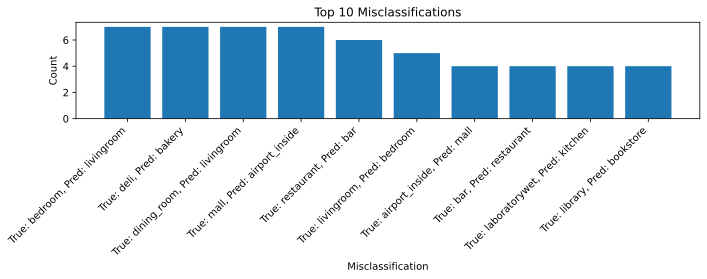

In [ ]:
from collections import Counter

# Get misclassifications
misclassifications = [(true, pred) for true, pred in zip(label_true, label_pred) if true != pred]
misclass_counts = Counter(misclassifications)

# Plot top 10 misclassifications
top_10 = misclass_counts.most_common(10)
labels, counts = zip(*top_10)
true_labels, pred_labels = zip(*labels)

plt.figure(figsize=(10, 4))
plt.bar(range(10), counts)
plt.xlabel('Misclassification')
plt.ylabel('Count')
plt.title('Top 10 Misclassifications')
plt.xticks(range(10), [f'True: {t}, Pred: {p}' for t, p in zip(true_labels, pred_labels)], rotation=45, ha='right')
plt.tight_layout()
plt.plot()
plt.savefig('/content/misclassifications.pdf')

# Model Export and Inference Optimization

## Installing required libraries

In [ ]:
!pip install onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 94.7 MB/s eta 0:00:00


In [ ]:
!pip install onnxruntime-gpu onnx onnxconverter_common==1.8.1 pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.8/77.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.5/291.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 7.4 MB/s eta 0:00:00


## Import required libraries

In [ ]:
import numpy as np    # we're going to use numpy to process input and output data
import onnxruntime    # to inference ONNX models, we use the ONNX Runtime
import onnx
from onnx import numpy_helper
import urllib.request
import json
import time

# display images in notebook
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

%matplotlib inline

## Export Model to onnx

In [ ]:
img, label = test_dataset[0]

In [ ]:
img.shape

torch.Size([3, 224, 224])

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model2 = model2.to(device)

In [ ]:
x = torch.randn(2, 3, 224, 224, requires_grad=True).to(device)

In [ ]:
#x = torch.randn(2, 3, 224, 224, requires_grad=True)
torch_out = model2(x)

# Export the model
torch.onnx.export(model2,                                       # model being run
                  x,                                           # model input (or a tuple for multiple inputs)
                  "resnet50dindoorcvpr.onnx",                            # where to save the model (can be a file or file-like object)
                  export_params=True,                          # store the trained parameter weights inside the model file
                  opset_version=10,                            # the ONNX version to export the model to
                  do_constant_folding=True,                    # whether to execute constant folding for optimization
                  input_names = ['input'],                     # the model's input names
                  output_names = ['output'],                   # the model's output names
                  dynamic_axes={'input' : {0 : 'batch_size'},  # variable length axes
                                'output': {0 : 'batch_size'}})

In [ ]:
import onnx

onnx_model = onnx.load("resnet50dindoorcvpr.onnx")
onnx.checker.check_model(onnx_model)

## Load and check onnx model

In [ ]:
onnx_model = onnx.load("resnet50dindoorcvpr.onnx")

In [ ]:
onnx.checker.check_model(onnx_model)

In [ ]:
traced_model=torch.jit.trace(model2, torch.rand(8,3,224,224).to(device))

In [ ]:
traced_output=traced_model(torch.rand(8,3,224,224).to(device))
traced_output.shape

torch.Size([8, 67])

## Downloading Imagenette labels and model

In [ ]:
onnx_model_url = "https://s3.amazonaws.com/onnx-model-zoo/resnet/resnet50v2/resnet50v2.tar.gz"
imagenet_labels_url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"

# retrieve our model from the ONNX model zoo
urllib.request.urlretrieve(onnx_model_url, filename="resnet50v2.tar.gz")
urllib.request.urlretrieve(imagenet_labels_url, filename="imagenet-simple-labels.json")

!tar xvzf resnet50v2.tar.gz --warning=no-unknown-keyword

resnet50v2/
resnet50v2/._resnet50v2.onnx
resnet50v2/resnet50v2.onnx
resnet50v2/test_data_set_0/
resnet50v2/test_data_set_1/
resnet50v2/test_data_set_2/
resnet50v2/test_data_set_2/._input_0.pb
resnet50v2/test_data_set_2/input_0.pb
resnet50v2/test_data_set_2/output_0.pb
resnet50v2/test_data_set_1/._input_0.pb
resnet50v2/test_data_set_1/input_0.pb
resnet50v2/test_data_set_1/output_0.pb
resnet50v2/test_data_set_0/._input_0.pb
resnet50v2/test_data_set_0/input_0.pb
resnet50v2/test_data_set_0/output_0.pb


In [ ]:
!ls resnet50v2

resnet50v2.onnx  test_data_set_0  test_data_set_1  test_data_set_2


In [ ]:
test_data_dir = 'resnet50v2/test_data_set'
test_data_num = 3

import glob
import os

# Load inputs
inputs = []
for i in range(test_data_num):
    input_file = os.path.join(test_data_dir + '_{}'.format(i), 'input_0.pb')
    tensor = onnx.TensorProto()
    with open(input_file, 'rb') as f:
        tensor.ParseFromString(f.read())
        inputs.append(numpy_helper.to_array(tensor))

print('Loaded {} inputs successfully.'.format(test_data_num))

# Load reference outputs

ref_outputs = []
for i in range(test_data_num):
    output_file = os.path.join(test_data_dir + '_{}'.format(i), 'output_0.pb')
    tensor = onnx.TensorProto()
    with open(output_file, 'rb') as f:
        tensor.ParseFromString(f.read())
        ref_outputs.append(numpy_helper.to_array(tensor))

print('Loaded {} reference outputs successfully.'.format(test_data_num))

Loaded 3 inputs successfully.
Loaded 3 reference outputs successfully.


## Inference using ONNX Runtime

In [ ]:
# Run the model on the backend
session = onnxruntime.InferenceSession('resnet50dindoorcvpr.onnx', None)

# get the name of the first input of the model
input_name = session.get_inputs()[0].name

print('Input Name:', input_name)

Input Name: input


In [ ]:
%%time
test_data_num = 3
outputs = [session.run([], {input_name: inputs[i]})[0] for i in range(test_data_num)]

CPU times: user 241 ms, sys: 6.94 ms, total: 248 ms
Wall time: 250 ms


## Classify sample images using our inference session

In [ ]:
def load_labels(path):
    with open(path) as f:
        data = json.load(f)
    return np.asarray(data)

def preprocess(input_data):
    # convert the input data into the float32 input
    img_data = input_data.astype('float32')

    #normalize
    mean_vec = np.array([0.485, 0.456, 0.406])
    stddev_vec = np.array([0.229, 0.224, 0.225])
    norm_img_data = np.zeros(img_data.shape).astype('float32')
    for i in range(img_data.shape[0]):
        norm_img_data[i,:,:] = (img_data[i,:,:]/255 - mean_vec[i]) / stddev_vec[i]

    #add batch channel
    norm_img_data = norm_img_data.reshape(1, 3, 224, 224).astype('float32')
    return norm_img_data

def softmax(x):
    x = x.reshape(-1)
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)

def postprocess(result):
    return softmax(np.array(result)).tolist()

In [ ]:
filename = '/content/data/test/bowling/bowling_0047.jpg'
input_image = Image.open(filename)

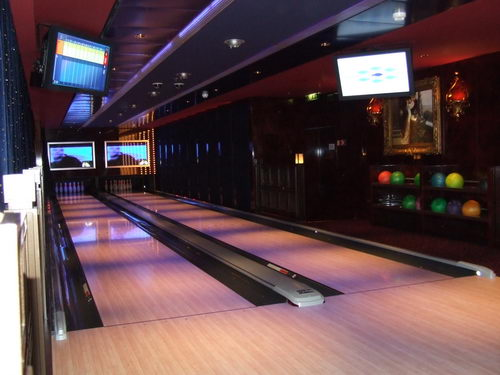

In [ ]:
input_image

In [ ]:
newsize = (224, 224)
input_image = input_image.resize(newsize)
# Shows the image in image viewer
input_image.show()

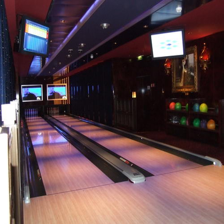

In [ ]:
input_image

In [ ]:
model2 = model2.to(device)
x = torch.randn(8, 3, 224, 224, requires_grad=True).to(device)

traced_model = torch.jit.trace(model2, x)

/usr/local/lib/python3.10/dist-packages/torch/jit/_trace.py:166: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at aten/src/ATen/core/TensorBody.h:489.)
  if a.grad is not None:


Image size:  (224, 224)


(3, 224, 224)

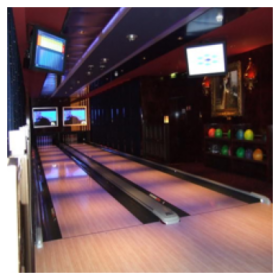

In [ ]:
labels = classes

print("Image size: ", input_image.size)
plt.axis('off')
display_image = plt.imshow(input_image)
image_data = np.array(input_image).transpose(2, 0, 1)
image_data.shape

In [ ]:
input_data = preprocess(image_data)

In [ ]:
input_data.shape

(1, 3, 224, 224)

In [ ]:
start = time.time()
raw_result = session.run([], {input_name: input_data})
end = time.time()
res = postprocess(raw_result)

Final top prediction is: bowling
Inference time: 478.14 ms
============ Top 5 labels are: ============================
['bowling', 'bar', 'subway', 'trainstation', 'airport_inside']


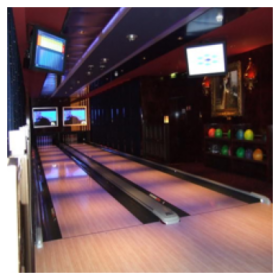

In [ ]:
inference_time = np.round((end - start) * 1000, 2)
idx = np.argmax(res)

print('========================================')
print('Final top prediction is: ' + labels[idx])
print('========================================')

print('========================================')
print('Inference time: ' + str(inference_time) + " ms")
print('========================================')

sort_idx = np.flip(np.squeeze(np.argsort(res)))
print('============ Top 5 labels are: ============================')
print([labels[i] for i in sort_idx[:5].tolist()])
print('===========================================================')

plt.axis('off')
display_image = plt.imshow(input_image)

In [ ]:
type(traced_model)

torch.jit._trace.TopLevelTracedModule

In [ ]:
traced_model(torch.rand(8, 3, 224, 224).to(device)).shape

torch.Size([8, 67])

In [ ]:
!pip install openvino

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 MB 19.2 MB/s eta 0:00:00


In [ ]:
filename = '/content/data/test/bowling/bowling_0047.jpg' # change to your filename
from torchvision import models, datasets, transforms as T
import torch
from PIL import Image
import numpy as np

input_image = Image.open(filename)
preprocess = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)
print("GPU Availability: ", torch.cuda.is_available())
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')

GPU Availability:  True


## Inference with ONNX Runtime

In [ ]:
# Inference with ONNX Runtime
import onnxruntime
from onnx import numpy_helper
import time

session_fp32 = onnxruntime.InferenceSession("resnet50dindoorcvpr.onnx", providers=['CPUExecutionProvider'])
# session_fp32 = onnxruntime.InferenceSession("resnet50.onnx", providers=['CUDAExecutionProvider'])
# session_fp32 = onnxruntime.InferenceSession("resnet50.onnx", providers=['OpenVINOExecutionProvider'])

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()


def run_sample(session, categories, inputs):
    latency = []
    start = time.time()
    input_arr = inputs.cpu().detach().numpy()
    ort_outputs = session.run([], {'input':input_arr})[0]
    latency.append(time.time() - start)
    output = ort_outputs.flatten()
    output = softmax(output) # this is optional
    top5_catid = np.argsort(-output)[:5]
    for catid in top5_catid:
        print(categories[catid], output[catid])
    return ort_outputs, latency

ort_output, latency = run_sample(session_fp32, classes, input_batch)
print("ONNX Runtime CPU/GPU/OpenVINO Inference time = {} ms".format(format(sum(latency) * 1000 / len(latency), '.2f')))

bowling 0.9606428
bar 0.005253632
trainstation 0.003914137
corridor 0.0025669632
airport_inside 0.0024800855
ONNX Runtime CPU/GPU/OpenVINO Inference time = 82.50 ms


In [ ]:
input_batch.shape

torch.Size([1, 3, 224, 224])

## Inference with OpenVINO

In [ ]:
#Inference with OpenVINO
from openvino.runtime import Core

ie = Core()
onnx_model_path = "./resnet50dindoorcvpr.onnx"
model_onnx = ie.read_model(model=onnx_model_path)
compiled_model_onnx = ie.compile_model(model=model_onnx, device_name="CPU")

# inference
output_layer = next(iter(compiled_model_onnx.outputs))

latency = []
input_arr = input_batch.cpu().detach().numpy()
inputs = {'input':input_arr}
start = time.time()
request = compiled_model_onnx.create_infer_request()
output = request.infer(inputs=inputs)

outputs = request.get_output_tensor(output_layer.index).data
latency.append(time.time() - start)

print("OpenVINO CPU Inference time = {} ms".format(format(sum(latency) * 1000 / len(latency), '.2f')))

print("***** Verifying correctness *****")
for i in range(2):
    print('OpenVINO and ONNX Runtime output {} are close:'.format(i), np.allclose(ort_output, outputs, rtol=1e-05, atol=1e-04))

OpenVINO CPU Inference time = 115.92 ms
***** Verifying correctness *****
OpenVINO and ONNX Runtime output 0 are close: True
OpenVINO and ONNX Runtime output 1 are close: True
